# Carga y preprocesamiento de datos multiclase

In [1]:
# importamos las librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler

In [2]:
# cargamos el dataset
df = pd.read_csv('../Data/Dry_Bean.csv')
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [3]:
# Verificamos las clases
df['Class'].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [4]:
# Utilizamos la función describe para ver las estadísticas de las variables
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [5]:
# Eliminamos los duplicados
df.drop_duplicates(inplace=True)

In [6]:
# Verificamos si hay valores nulos
df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

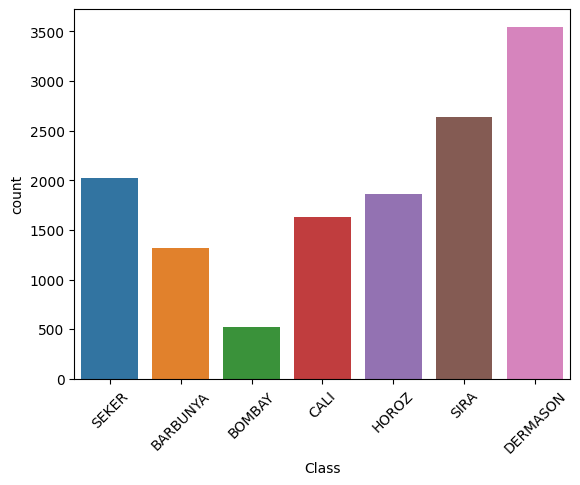

In [7]:
# Graficamos un countplot para ver la distribución de las clases
sns.countplot(x='Class', data=df)
plt.xticks(rotation=45);

In [8]:
# Realizamos undersampling para balancear las clases
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=42)

In [9]:
# Separamos las variables independientes de la dependiente
X = df.drop('Class', axis=1)
y = df['Class']

# Aplicamos el undersampling
X_rus, y_rus = rus.fit_resample(X, y)

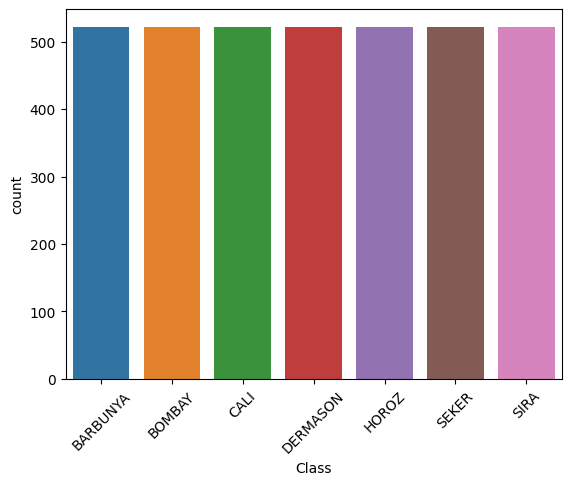

In [10]:
# Verificamos la distribución de las clases
sns.countplot(x=y_rus)
plt.xticks(rotation=45);

In [11]:
# Verificamos la cantidad de datos
print(f'''
Cantidad de datos antes del undersampling: {len(df)}
Cantidad de datos después del undersampling: {len(X_rus)}
    ''')


Cantidad de datos antes del undersampling: 13543
Cantidad de datos después del undersampling: 3654
    


In [12]:
# convertimos las clases a números
y_rus.replace(['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'], [1,2,3,4,5,6,7], inplace=True)
list(y_rus.unique())

[1, 2, 3, 4, 5, 6, 7]

# Análisis exploratorio y escalamiento de datos multiclase

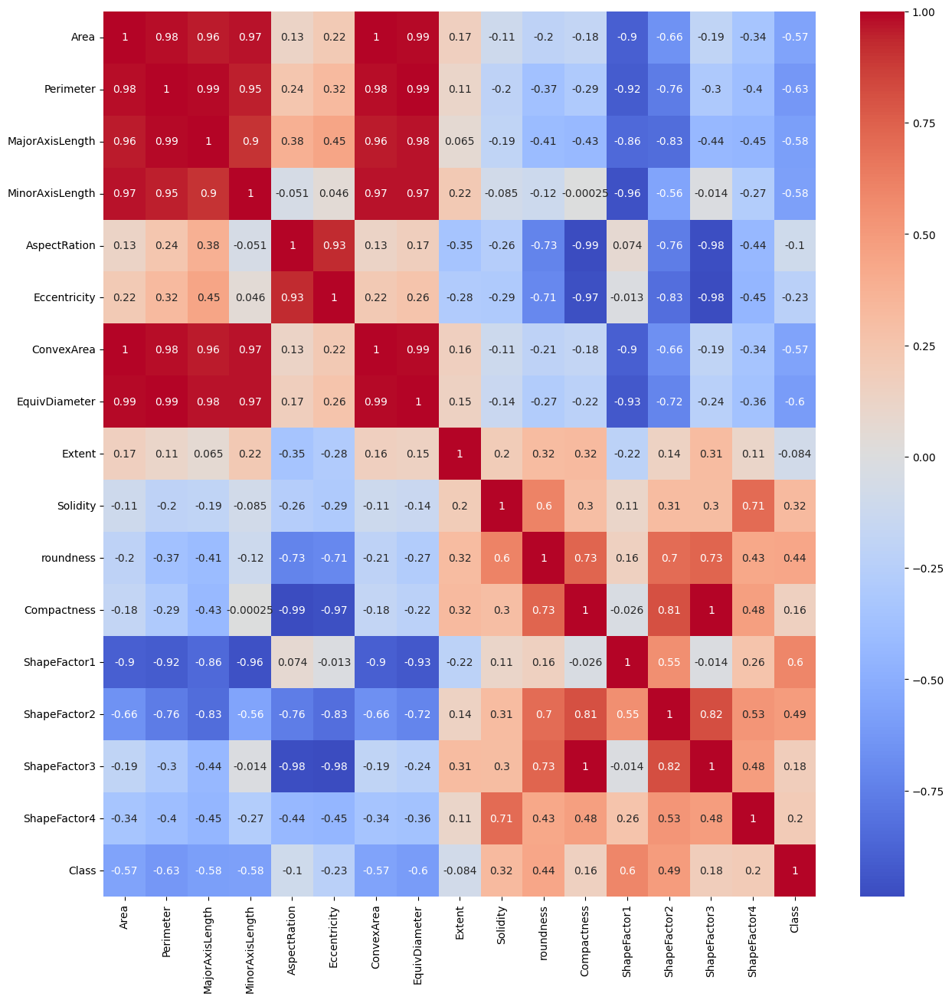

In [13]:
# Creamos una copia del dataset
df_dea = X_rus.copy(deep=True)
df_dea['Class'] = y_rus

# Realizamos una matriz de correlación
plt.figure(figsize=(15, 15))
sns.heatmap(df_dea.corr(numeric_only=True), annot=True, cmap='coolwarm');

In [14]:
# Eliminamos las variables con una correlación mayor a 0.9
X_rus.drop(['ConvexArea', 'EquivDiameter'], axis=1, inplace=True)

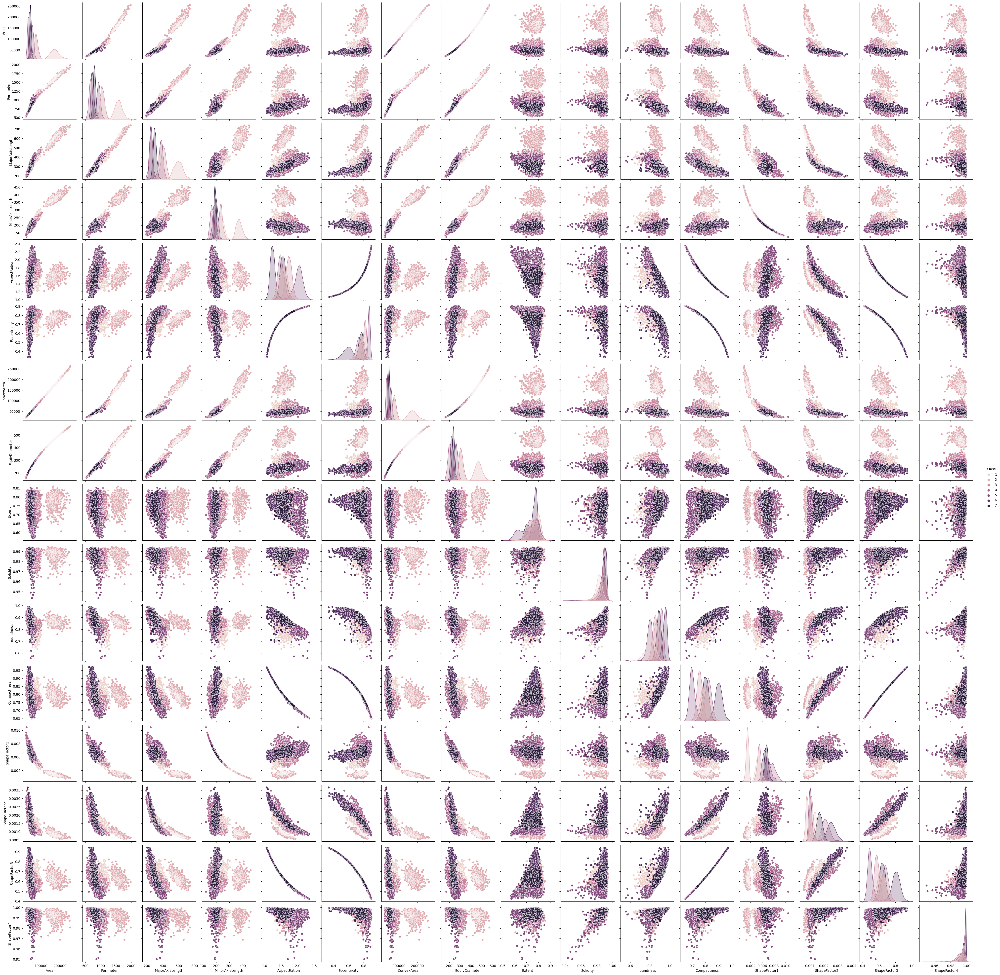

In [15]:
# Utilizamos pairplot para ver la relación entre las variables
sns.pairplot(df_dea, hue='Class');

In [16]:
# Dividimos el dataset en train y test
X_train, X_test, y_train, y_test = train_test_split(X_rus, y_rus, test_size=0.2, random_state=42, shuffle=True)
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.transform(y_test)

In [17]:
# Normalizamos los datos
sc_x = StandardScaler()
X_train = sc_x.fit_transform(X_train)
X_test = sc_x.transform(X_test)

# Entrenamiento y evaluación de regresión logística multiclase

In [18]:
%run "Funciones auxiliares/Funciones_auxiliares.ipynb"

In [19]:
def logistic_model(C_,solver_ , multiclass_):
    logistic_regression_model = LogisticRegression(random_state=42, solver= solver_, multi_class= multiclass_, n_jobs=-1, C=C_ )
    return logistic_regression_model

c:\Programacion\Python\Python310\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Accuracy: 0.9247606019151847


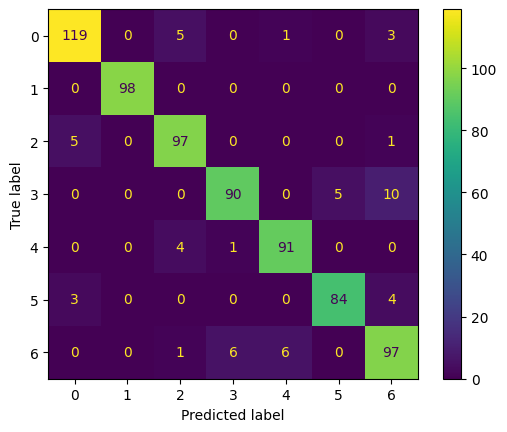

In [20]:
model = logistic_model(1, 'saga', 'multinomial') # Creamos el modelo
model.fit(X_train, y_train) # Entrenamos el modelo
y_pred = model.predict(X_test) # Predecimos con el modelo

# graficamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm, display_labels=model.classes_).plot();
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

In [28]:
# Realizamos iteraciones para probar diferentes resolver y multi_class
multiclass = ['ovr','multinomial']
solver_list = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
scores = []
params=[]
for i in multiclass:
    for j in solver_list:
        try:
            model = logistic_model(1,j,i)
            model.fit(X_train, y_train)
            predictions = model.predict(X_test)
            params.append(i + '-'+ j)
            accuraccy = accuracy_score(y_test,predictions)
            scores.append(accuraccy)
        except:
            None    

c:\Programacion\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  warnings.warn(
c:\Programacion\Python\Python310\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Programacion\Python\Python310\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Programacion\Python\Python310\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Programacion\Python\Python310\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


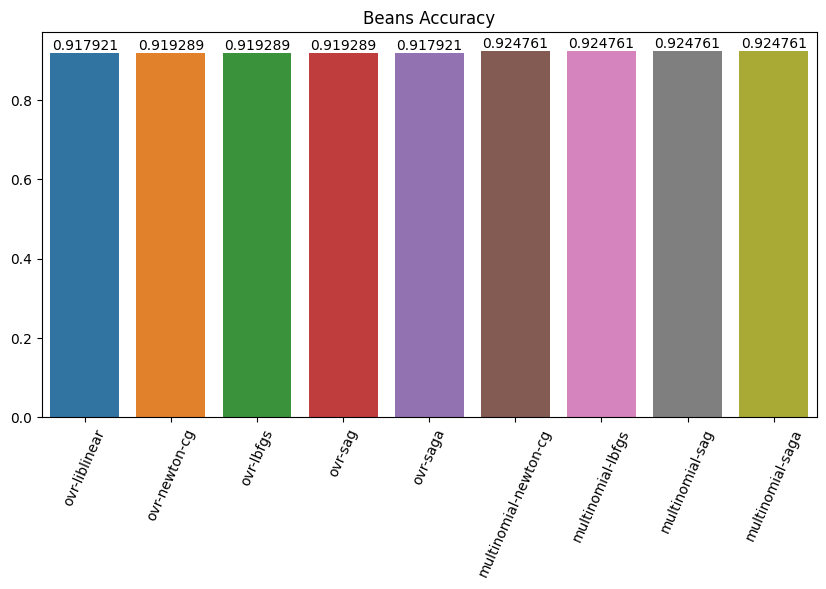

In [30]:
# Evaluamos los resultados
fig, ax1 = plt.subplots(figsize=(10,5))

ax = sns.barplot(
        ax=ax1,
        x  = params,
        y = scores
        )
ax.set_title('Beans Accuracy')
ax.set_xticklabels(labels = ax.get_xticklabels(), rotation=66)
ax.bar_label(ax.containers[0]);


Accuracy: 0.9247606019151847


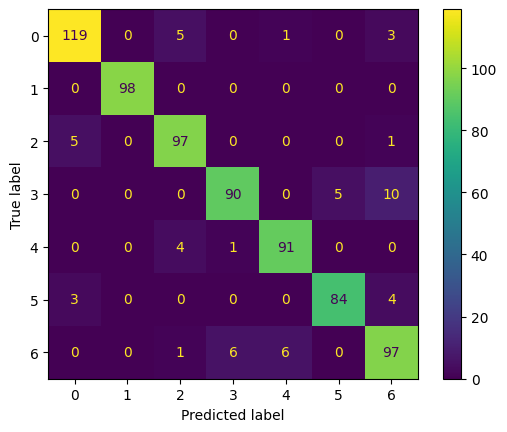

In [31]:
model = logistic_model(1, 'newton-cg', 'multinomial') # Creamos el modelo
model.fit(X_train, y_train) # Entrenamos el modelo
y_pred = model.predict(X_test) # Predecimos con el modelo

# graficamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm, display_labels=model.classes_).plot();
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')